In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix,f1_score, precision_score, recall_score, accuracy_score
from sklearn.model_selection import train_test_split
from tensorflow.keras.applications.efficientnet import EfficientNetB0
from sklearn.neighbors import KNeighborsClassifier
import cv2
import pickle
import random
import os

class Ensemble:
    def __init__(self):
        self.x_train = None
        self.x_test = None
        self.y_train = None
        self.y_test = None
        self.k = 5

    def load_data(self, x_train, x_test, y_train, y_test):
        self.x_train = x_train
        self.x_test =  x_test
        self.y_train = y_train
        self.y_test = y_test

    def StackingClassifier(self):
        # Define weak learners
        weak_learners = [('svm', SVC()),
                        ('rf', RandomForestClassifier()),
                         ('knn', KNeighborsClassifier()),
                        #('effnet', EfficientNetB0(weights='imagenet', include_top=False)),
                         ]

        # Finaler learner or meta model
        final_learner = LogisticRegression()

        train_meta_model = None
        test_meta_model = None

        # Start stacking
        for clf_id, clf in weak_learners:
            print("Classifier ID: ", clf_id)
            # Predictions for each classifier based on k-fold
            predictions_clf = self.k_fold_cross_validation(clf)

            # Predictions for test set for each classifier based on train of level 0
            test_predictions_clf = self.train_level_0(clf)

            # Stack predictions which will form
            # the inputa data for the data model
            if isinstance(train_meta_model, np.ndarray):
                train_meta_model = np.vstack((train_meta_model, predictions_clf))
            else:
                train_meta_model = predictions_clf

            # Stack predictions from test set
            # which will form test data for meta model
            if isinstance(test_meta_model, np.ndarray):
                test_meta_model = np.vstack((test_meta_model, test_predictions_clf))
            else:
                test_meta_model = test_predictions_clf

        # Transpose train_meta_model
        train_meta_model = train_meta_model.T

        # Transpose test_meta_model
        test_meta_model = test_meta_model.T

        # Training level 1
        self.train_level_1(final_learner, train_meta_model, test_meta_model)

    import numpy as np

    # Inside your Ensemble class
    def k_fold_cross_validation(self, clf):
        print("k-fold cross validation")

        predictions_clf = None

        # Convert self.x_train to numpy array
        self.x_train = np.array(self.x_train)

        # Number of samples per fold
        batch_size = int(len(self.x_train) / self.k)

        # Start k-fold cross validation
        for fold in range(self.k):
            print("fold number: ", fold)
            # Settings for each batch_size
            if fold == (self.k - 1):
                test = self.x_train[(batch_size * fold):, :]
                batch_start = batch_size * fold
                batch_finish = self.x_train.shape[0]
            else:
                test = self.x_train[(batch_size * fold): (batch_size * (fold + 1)), :]
                batch_start = batch_size * fold
                batch_finish = batch_size * (fold + 1)

            # test & training samples for each fold iteration
            fold_x_test = self.x_train[batch_start:batch_finish, :]
            fold_x_train = self.x_train[[index for index in range(self.x_train.shape[0]) if
                                        index not in range(batch_start, batch_finish)], :]

            # test & training targets for each fold iteration
            fold_y_test = self.y_train[batch_start:batch_finish]
            # test & training targets for each fold iteration
            fold_indices = [index for index in range(len(self.x_train)) if index not in range(batch_start, batch_finish)]
            fold_y_train = [self.y_train[index] for index in fold_indices]

            # Fit current classifier
            clf.fit(fold_x_train, fold_y_train)
            fold_y_pred = clf.predict(fold_x_test)

            # Store predictions for each fold_x_test
            if isinstance(predictions_clf, np.ndarray):
                predictions_clf = np.concatenate((predictions_clf, fold_y_pred))
            else:
                predictions_clf = fold_y_pred

        return predictions_clf


    def train_level_0(self, clf):
        print("train level-0")
        # Train in full real training set
        clf.fit(self.x_train, self.y_train)
        # Get predictions from full real test set
        y_pred = clf.predict(self.x_test)

        return y_pred

    def train_level_1(self, final_learner, train_meta_model, test_meta_model):
        print("train level-1")
        # Train is carried out with final learner or meta model
        final_learner.fit(train_meta_model, self.y_train)
        # Getting train and test accuracies from meta_model
        print(f"Train accuracy: {final_learner.score(train_meta_model, self.y_train)}")
        print(f"Test accuracy: {final_learner.score(test_meta_model, self.y_test)}")

        predictions = final_learner.predict(test_meta_model)

        print('Accuracy Stacking: ', accuracy_score(predictions, self.y_test))
        print('Confusion matrix Stacking: ')
        #print(confusion_matrix(predictions, self.y_test))
        #print('Classification report Stacking: ', classification_report(predictions, self.y_test))
        print('F1-score Stacking: ', f1_score(predictions, self.y_test, average='weighted'))
        print('Precision score Stacking: ', precision_score(predictions, self.y_test, average='weighted'))
        #print('Recall score Stacking: ', recall_score(predictions, self.y_test, average='weighted'))

if __name__ == "__main__":
    ensemble = Ensemble()

    # dir = '/content/drive/MyDrive/skin-dataset/skin-dataset'
    # categories = ['dry', 'normal','oily']

    # data = []
    # for category in categories:
    #     cnt = 0
    #     path = os.path.join(dir, category)
    #     for img in os.listdir(path):
    #         cnt += 1
    #         img_array = cv2.imread(os.path.join(path, img))
    #         #cv2.imshow('image', img_array)
    #         try:
    #             img_array = cv2.resize(img_array, (50, 50))
    #             image = np.array(img_array).flatten()
    #             data.append([image, categories.index(category)])
    #         except Exception as e:
    #             pass

    #     print(f'{category} : {cnt} images')

    # print(len(data))
    # pick_in = open('data.pickle', 'wb')
    # pickle.dump(data, pick_in)
    # pick_in.close()

    pick_in = open('data.pickle', 'rb')
    data = pickle.load(pick_in)
    pick_in.close()

    random.shuffle(data)
    features = []
    labels = []

    for feature, label in data:
        features.append(feature)
        labels.append(label)

    xtrain, xtest, ytrain, ytest = train_test_split(features, labels, test_size=0.3)

    ensemble.load_data(x_train = xtrain, x_test = xtest, y_train = ytrain, y_test = ytest)
    ensemble.StackingClassifier()

Classifier ID:  svm
k-fold cross validation
fold number:  0
fold number:  1
fold number:  2
fold number:  3
fold number:  4
train level-0
Classifier ID:  rf
k-fold cross validation
fold number:  0
fold number:  1
fold number:  2
fold number:  3
fold number:  4
train level-0
Classifier ID:  knn
k-fold cross validation
fold number:  0
fold number:  1
fold number:  2
fold number:  3
fold number:  4
train level-0
train level-1
Train accuracy: 0.7829457364341085
Test accuracy: 0.7771084337349398
Accuracy Stacking:  0.7771084337349398
Confusion matrix Stacking: 
F1-score Stacking:  0.8101565840035803
Precision score Stacking:  0.85726716389367


In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix, f1_score, precision_score, recall_score, accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
import cv2
import pickle
import random
import os

class Ensemble:
    def __init__(self):
        self.x_train = None
        self.x_test = None
        self.y_train = None
        self.y_test = None
        self.k = 5

    def load_data(self, x_train, x_test, y_train, y_test):
        self.x_train = x_train
        self.x_test =  x_test
        self.y_train = y_train
        self.y_test = y_test

    def BaggingClassifier(self):
      # Define weak learners
      weak_learners = [('svm', SVC()),
                      ('rf', RandomForestClassifier()),
                      ('knn', KNeighborsClassifier()),
                      #('effnet', EfficientNetB0(weights='imagenet', include_top=False)),
                      ]

      # Final learner or meta model
      final_learner = LogisticRegression()

      train_meta_model = None
      test_meta_model = None

      # Start bagging
      for clf_id, clf in weak_learners:
          print("Classifier ID: ", clf_id)
          # Predictions for each classifier based on bagging
          predictions_clf_train = self.bagging(clf, self.x_train, self.y_train)
          predictions_clf_test = clf.predict(self.x_test)

          # Stack predictions which will form
          # the input data for the meta model
          if isinstance(train_meta_model, np.ndarray):
              train_meta_model = np.vstack((train_meta_model, predictions_clf_train))
          else:
              train_meta_model = predictions_clf_train

          # Stack predictions from test set
          # which will form test data for meta model
          if isinstance(test_meta_model, np.ndarray):
              test_meta_model = np.vstack((test_meta_model, predictions_clf_test))
          else:
              test_meta_model = predictions_clf_test

      # Transpose train_meta_model
      train_meta_model = train_meta_model.T

      # Transpose test_meta_model
      test_meta_model = test_meta_model.T

      # Print shapes for debugging
      print("Shapes for level 1 training:")
      print("train_meta_model:", train_meta_model.shape)
      print("self.y_train:", np.array(self.y_train).shape)
      print("Shapes for level 1 testing:")
      print("test_meta_model:", test_meta_model.shape)
      print("self.y_test:", np.array(self.y_test).shape)

      # Training level 1
      self.train_level_1(final_learner, train_meta_model, test_meta_model)

    def bagging(self, clf, x_train, y_train):
        print("Bagging")

        predictions_clf = None

        # Convert x_train to numpy array
        x_train = np.array(x_train)

        # Start bagging
        for _ in range(self.k):
            # Sample with replacement
            indices = np.random.choice(len(x_train), len(x_train), replace=True)
            sample_x = x_train[indices]
            sample_y = np.array(y_train)[indices]

            # Fit classifier on the sampled data
            clf.fit(sample_x, sample_y)

            # Predictions for current classifier
            fold_y_pred = clf.predict(x_train)

            # Store predictions
            if isinstance(predictions_clf, np.ndarray):
                predictions_clf = np.vstack((predictions_clf, fold_y_pred))
            else:
                predictions_clf = fold_y_pred

        # Take majority vote as final prediction
        final_predictions = np.apply_along_axis(lambda x: np.argmax(np.bincount(x)), axis=0, arr=predictions_clf)
        return final_predictions

    def train_level_1(self, final_learner, train_meta_model, test_meta_model):
        print("train level-1")
        # Print shapes for debugging
        print("Shapes for fitting final learner:")
        print("train_meta_model:", train_meta_model.shape)
        print("self.y_train:", np.array(self.y_train).shape)

        # Train with final learner or meta model
        final_learner.fit(train_meta_model, self.y_train)
        # Getting train and test accuracies from meta model
        print(f"Train accuracy: {final_learner.score(train_meta_model, self.y_train)}")
        print(f"Test accuracy: {final_learner.score(test_meta_model, self.y_test)}")

        predictions = final_learner.predict(test_meta_model)

        print('Accuracy Bagging: ', accuracy_score(predictions, self.y_test))
        print('Confusion matrix Bagging: ')
        # print(confusion_matrix(predictions, self.y_test))
        # print('Classification report Bagging: ', classification_report(predictions, self.y_test))
        print('F1-score Bagging: ', f1_score(predictions, self.y_test, average='weighted'))
        print('Precision score Bagging: ', precision_score(predictions, self.y_test, average='weighted'))
        # print('Recall score Bagging: ', recall_score(predictions, self.y_test, average='weighted'))

if __name__ == "__main__":
    ensemble = Ensemble()

    dir = '/content/drive/MyDrive/skin-dataset/skin-dataset'
    categories = ['dry', 'normal','oily']

    data = []
    for category in categories:
        cnt = 0
        path = os.path.join(dir, category)
        for img in os.listdir(path):
            cnt += 1
            img_array = cv2.imread(os.path.join(path, img))
            #cv2.imshow('image', img_array)
            try:
                img_array = cv2.resize(img_array, (50, 50))
                image = np.array(img_array).flatten()
                data.append([image, categories.index(category)])
            except Exception as e:
                pass

        print(f'{category} : {cnt} images')

    print(len(data))
    pick_in = open('data.pickle', 'wb')
    pickle.dump(data, pick_in)
    pick_in.close()

    # Load and preprocess data
    pick_in = open('data.pickle', 'rb')
    data = pickle.load(pick_in)
    pick_in.close()

    random.shuffle(data)
    features = []
    labels = []

    for feature, label in data:
        features.append(feature)
        labels.append(label)

    # Split data into training and testing sets
    xtrain, xtest, ytrain, ytest = train_test_split(features, labels, test_size=0.3)

    # Check dimensions of the data
    print("Training data dimensions:")
    print(len(xtrain), len(ytrain))
    print("Testing data dimensions:")
    print(len(xtest), len(ytest))

    # Ensure dimensions match before loading the data
    if len(xtrain) == len(ytrain) and len(xtest) == len(ytest):
        ensemble.load_data(x_train=xtrain, x_test=xtest, y_train=ytrain, y_test=ytest)
        ensemble.BaggingClassifier()
    else:
        print("Error: Inconsistent number of samples between input variables.")


dry : 372 images
normal : 39 images
oily : 143 images
553
Training data dimensions:
387 387
Testing data dimensions:
166 166
Classifier ID:  svm
Bagging
Classifier ID:  rf
Bagging
Classifier ID:  knn
Bagging
Shapes for level 1 training:
train_meta_model: (166, 3)
self.y_train: (387,)
Shapes for level 1 testing:
test_meta_model: (166, 3)
self.y_test: (166,)
train level-1
Shapes for fitting final learner:
train_meta_model: (166, 3)
self.y_train: (387,)


ValueError: Found input variables with inconsistent numbers of samples: [166, 387]

In [ ]:
import os
import cv2
import numpy as np
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

# Function to extract features from images after resizing
def extract_features(image_path, target_size=(100, 100)):
    image = cv2.imread(image_path)
    if image is None:
        print(f"Error: Unable to read image '{image_path}'")
        return None
    # Resize the image to a fixed size
    image = cv2.resize(image, target_size)
    # Flatten the image pixels as features
    return image.flatten()

# Path to the dataset folder
dataset_folder = '/content/drive/MyDrive/skin-dataset/skin-dataset'

# List to store features and labels
features = []
labels = []

# Mapping for skin types to labels
label_mapping = {"dry": 0, "normal": 1, "oily": 2}

# Iterate over subfolders (dry, normal, and oily)
for skin_type in os.listdir(dataset_folder):
    skin_type_folder = os.path.join(dataset_folder, skin_type)
    if os.path.isdir(skin_type_folder):
        label = label_mapping.get(skin_type)
        # Iterate over each image file in the subfolder
        for filename in os.listdir(skin_type_folder):
            if filename.endswith(".jpg") or filename.endswith(".jpeg"):
                # Extract features from the image
                image_path = os.path.join(skin_type_folder, filename)
                image_features = extract_features(image_path)
                if image_features is not None:
                    # Add features and corresponding label to lists
                    features.append(image_features)
                    labels.append(label)

# Convert lists to numpy arrays
X = np.array(features)
y = np.array(labels)

# Splitting the dataset into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Check if X_train or y_train is empty
if len(X_train) == 0 or len(y_train) == 0:
    print("Error: No training data found")
    exit()

# Initialize base classifiers
random_forest = RandomForestClassifier(n_estimators=100, random_state=42)
knn = KNeighborsClassifier(n_neighbors=5)
svm = SVC(kernel='linear', C=1.0)

# Initialize bagging classifiers
bagging_rf = BaggingClassifier(base_estimator=random_forest, n_estimators=10, random_state=42)
bagging_knn = BaggingClassifier(base_estimator=knn, n_estimators=10, random_state=42)
bagging_svm = BaggingClassifier(base_estimator=svm, n_estimators=10, random_state=42)

# Train bagging classifiers
bagging_rf.fit(X_train, y_train)
bagging_knn.fit(X_train, y_train)
bagging_svm.fit(X_train, y_train)

# Predictions
y_pred_rf = bagging_rf.predict(X_test)
y_pred_knn = bagging_knn.predict(X_test)
y_pred_svm = bagging_svm.predict(X_test)

# Combine predictions from all classifiers
y_pred_ensemble = np.vstack((y_pred_rf, y_pred_knn, y_pred_svm)).T
# Voting to get final prediction
y_pred_final = np.array([np.argmax(np.bincount(row)) for row in y_pred_ensemble])

# Accuracy of the ensemble model
accuracy_ensemble = accuracy_score(y_test, y_pred_final)
print("Ensemble Model Accuracy:", accuracy_ensemble)

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


Ensemble Model Accuracy: 0.8252427184466019


--2024-04-06 17:50:14--  https://raw.githubusercontent.com/Hrushi11/Dogs_VS_Cats/main/helper_functions.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 10139 (9.9K) [text/plain]
Saving to: ‘helper_functions.py.4’

helper_functions.py 100%[===================>]   9.90K  --.-KB/s    in 0s      

2024-04-06 17:50:14 (97.7 MB/s) - ‘helper_functions.py.4’ saved [10139/10139]

Found 444 images belonging to 3 classes.
Found 109 images belonging to 3 classes.
(109,)
(444,)
{'oily': 0, 'normal': 1, 'dry': 2}
{'oily': 0, 'normal': 1, 'dry': 2}
Epoch 1/5
14/14 [==============================] - 21s 827ms/step - loss: 0.7468 - accuracy: 0.6554 - val_loss: 0.3364 - val_accuracy: 0.8750
Epoch 2/5
14/14 [==============================] - 10s 710ms/step - loss: 0.4056 - a

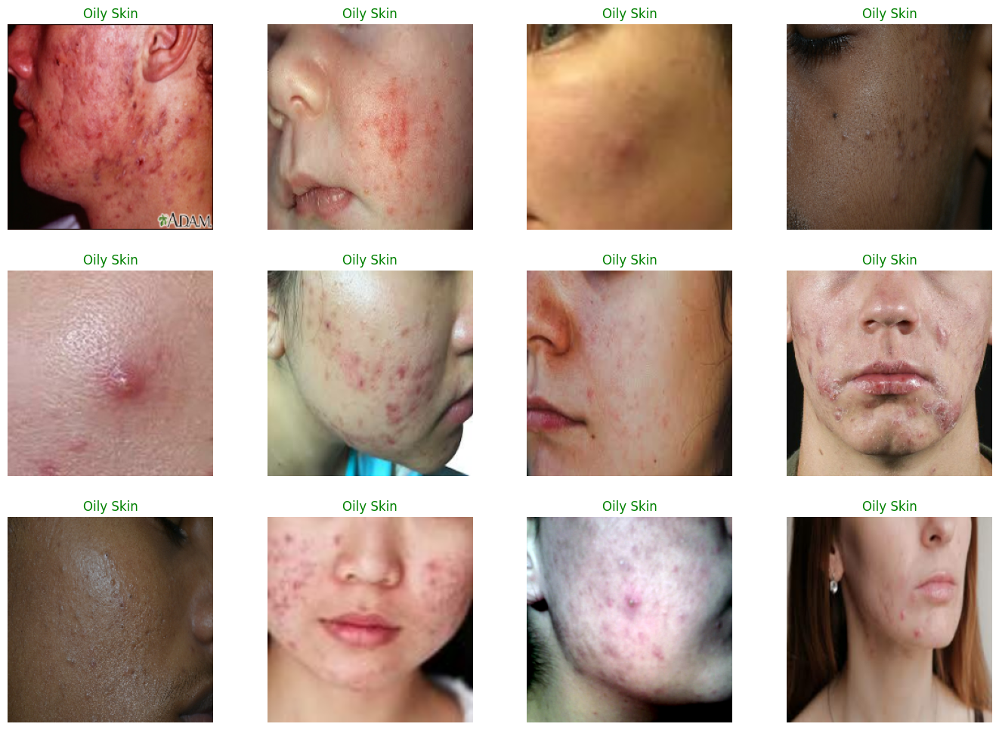

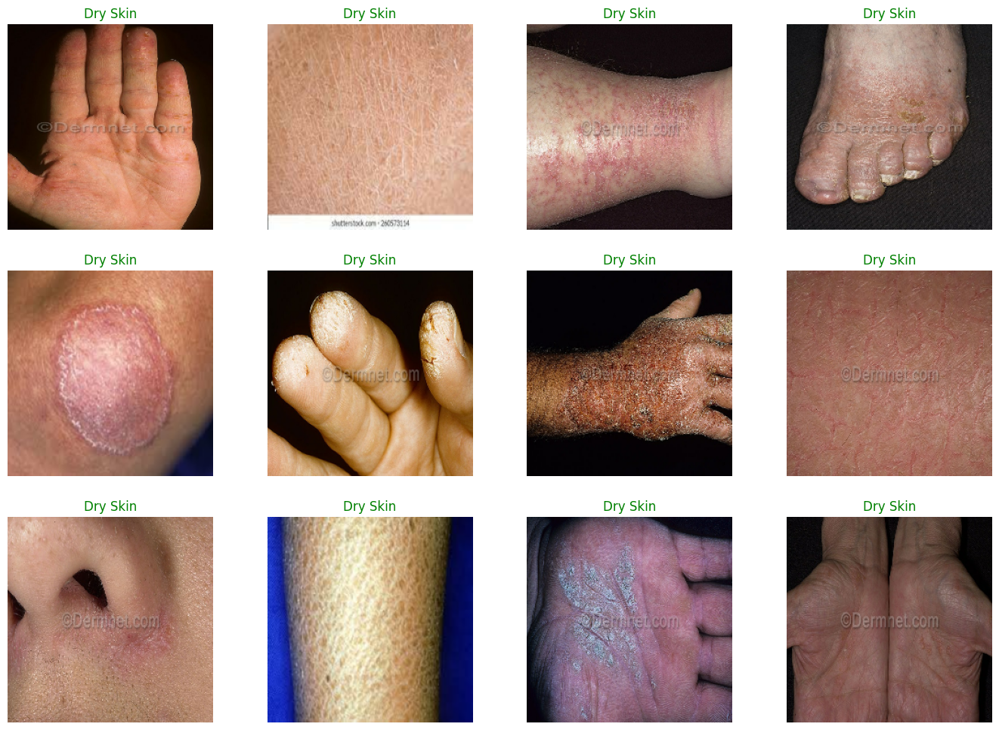

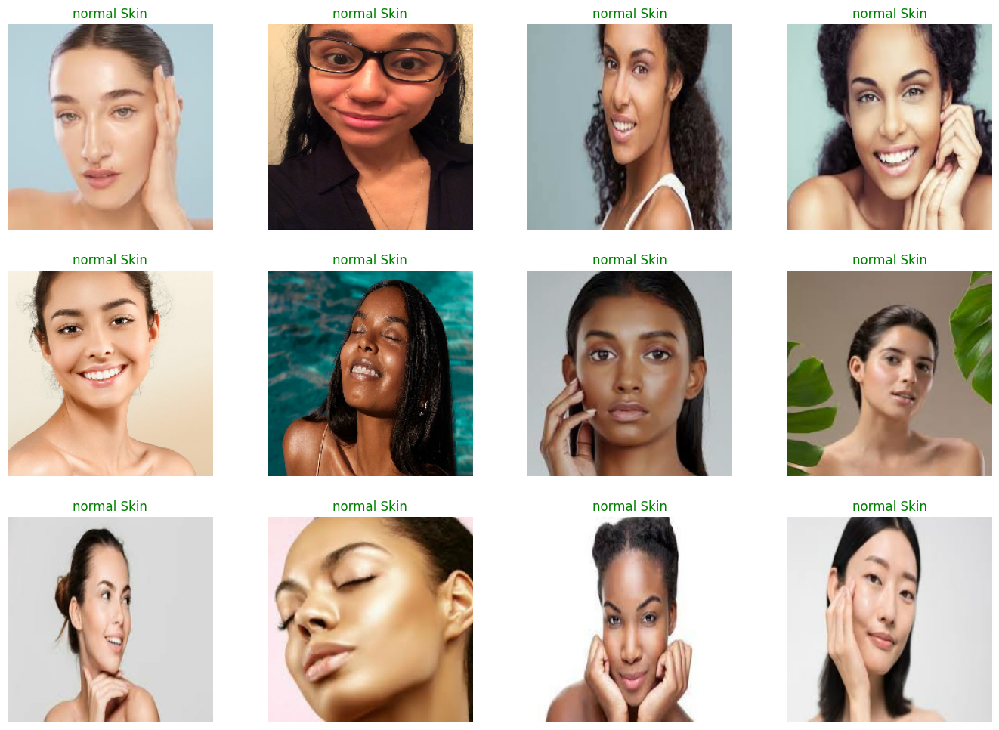

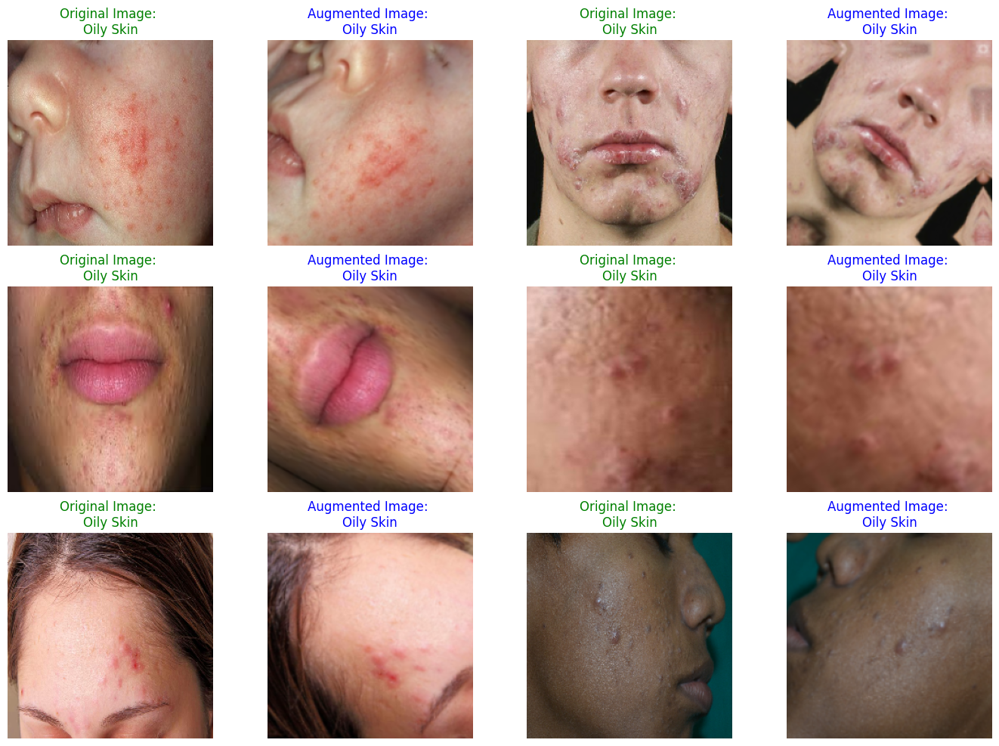

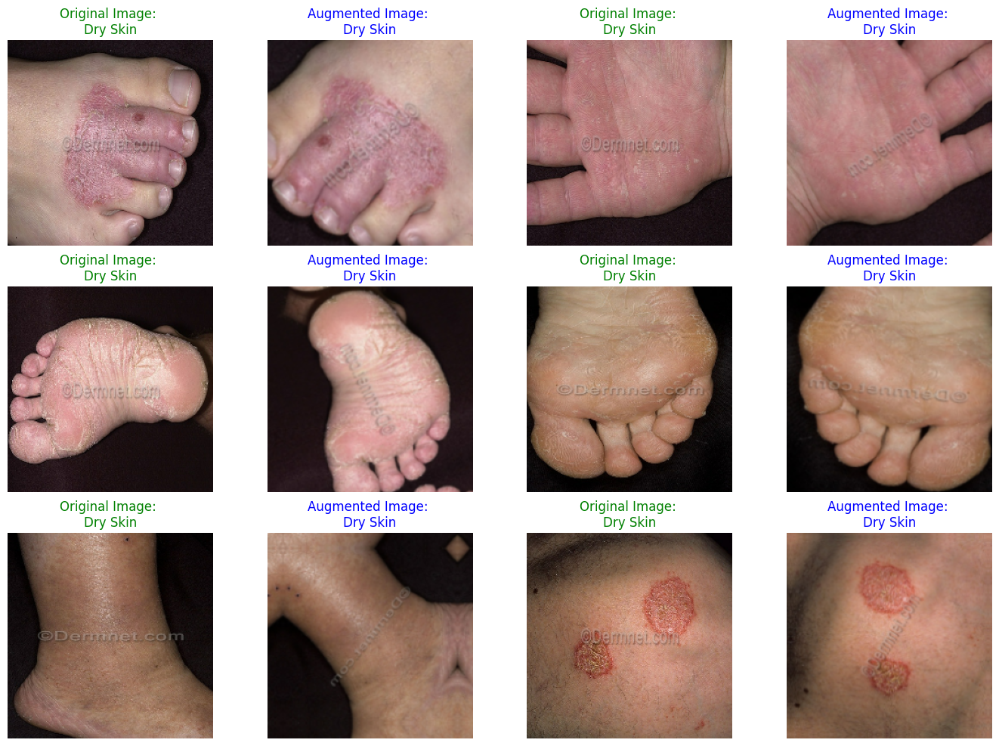

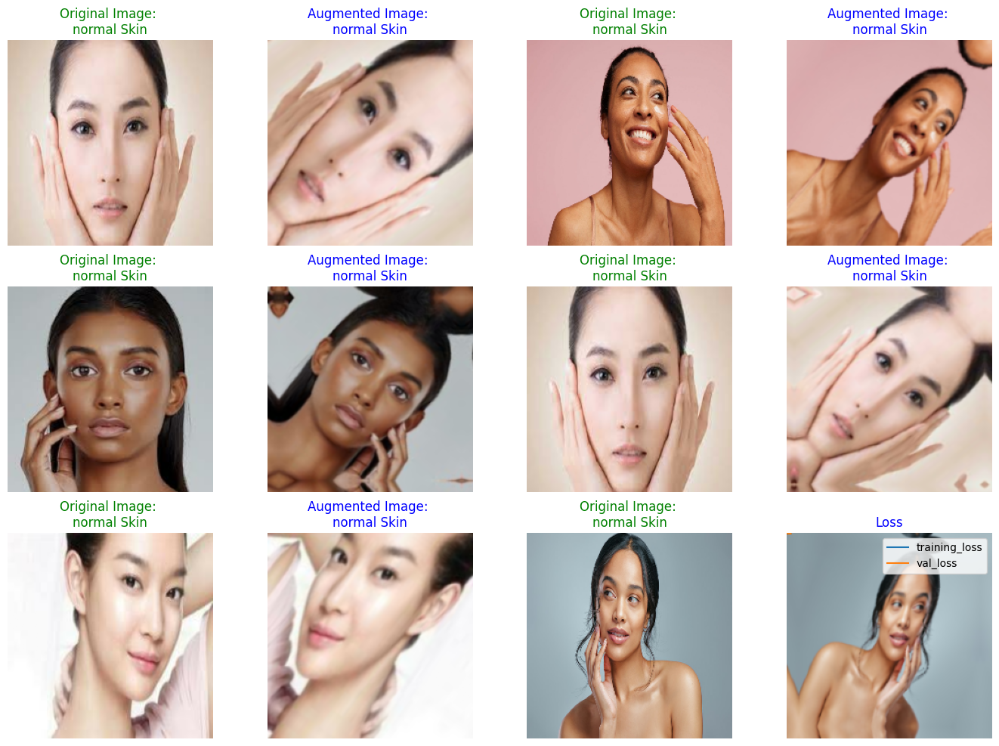

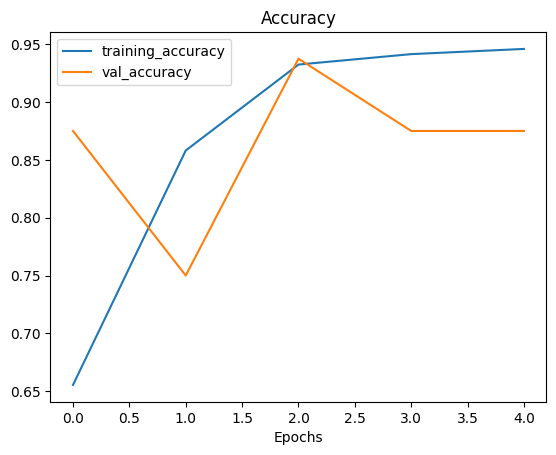

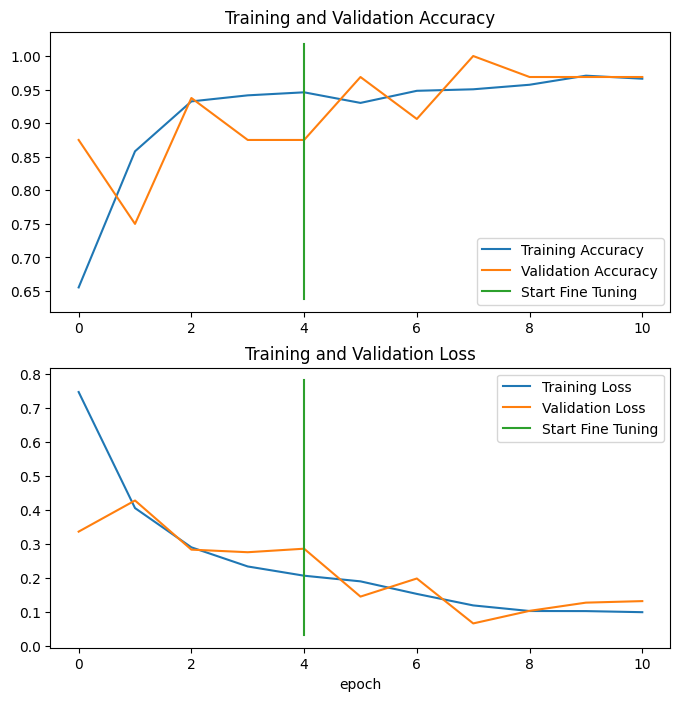

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 224, 224, 3)]     0         
                                                                 
 data_augmentation_layer (S  (None, None, None, None   0         
 equential)                  )                                   
                                                                 
 efficientnetb0 (Functional  (None, None, None, 1280   4049571   
 )                           )                                   
                                                                 
 global_average_pooling (Gl  (None, 1280)              0         
 obalAveragePooling2D)                                           
                                                                 
 output_layer (Dense)        (None, 3)                 3843      
                                                           

ValueError: Found input variables with inconsistent numbers of samples: [0, 109]

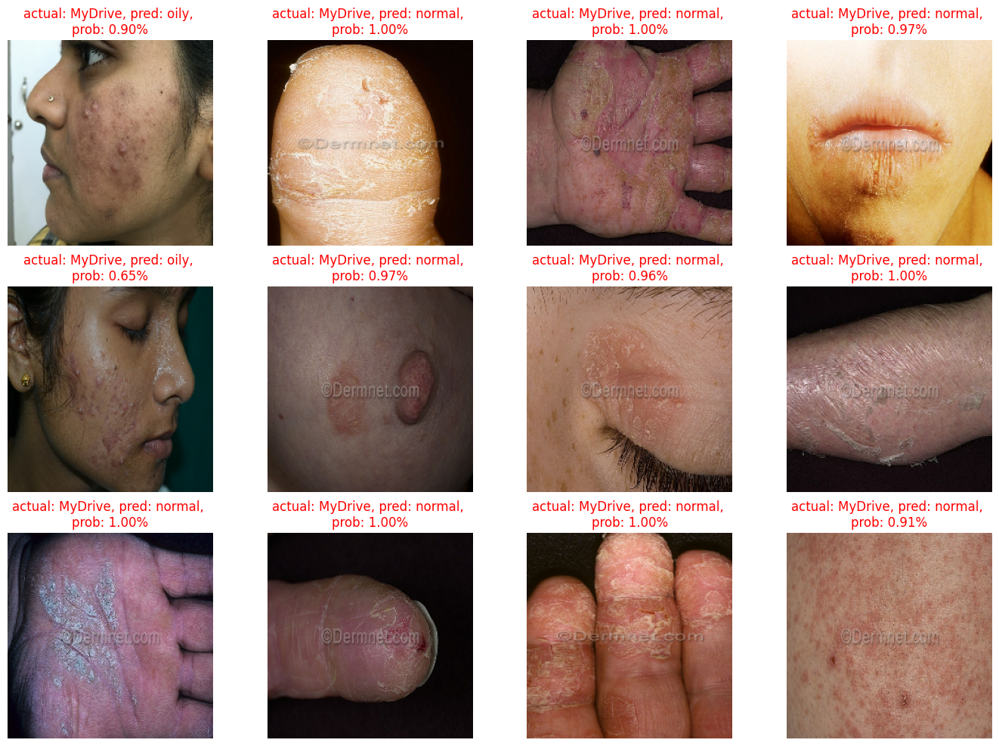

In [10]:
# downloading helper_functions.py
! wget https://raw.githubusercontent.com/Hrushi11/Dogs_VS_Cats/main/helper_functions.py

# Importing dependancies
import os
import random
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
from os import listdir

from tensorflow.keras.layers.experimental import preprocessing
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from helper_functions import plot_loss_curves, compare_historys, make_confusion_matrix


# Setting dir paths
oil_dir = "/content/drive/MyDrive/skin-dataset/skin-dataset/oily"
dry_dir = "/content/drive/MyDrive/skin-dataset/skin-dataset/dry"
normal_dir = "/content/drive/MyDrive/skin-dataset/skin-dataset/normal"

# Getting all the paths in a list for oil and dry skins
oil_list = []
for path in os.listdir(oil_dir):
  oil_list.append(oil_dir + "/" + path)

dry_list = []
for path in os.listdir(dry_dir):
  dry_list.append(dry_dir + "/" + path)


normal_list = []
for path in os.listdir(normal_dir):
  normal_list.append(normal_dir + "/" + path)


# Preprocess img function
IMG_SIZE = (224, 224)
def load_and_prep(filepath):
  img_path = tf.io.read_file(filepath)
  img = tf.io.decode_image(img_path)
  img = tf.image.resize(img, IMG_SIZE)

  return img


# Getting only those images which are suitable
def corrImgs(arr):
  corrImgList = []
  for path in arr:
    img = load_and_prep(path)
    if (img.shape[2] == 3) | (img.shape == 4):
      corrImgList.append(path)

  return corrImgList



# Randomly plotting the Oily Skin images
random_oil_skin = np.random.choice(oil_list, size=12, replace=False)
plt.figure(figsize=(17, 12))
for i in range(12):
  img_path = random_oil_skin[i]
  img = load_and_prep(img_path)

  # plotting the images
  plt.subplot(3, 4, i+1)
  plt.axis(False)
  plt.imshow(img/255)
  plt.title("Oily Skin", color="green")



# Randomly plotting the Dry Skin images
random_dry_skin = np.random.choice(dry_list, size=12, replace=False)
plt.figure(figsize=(17, 12))
for i in range(12):
  img_path = random_dry_skin[i]
  img = load_and_prep(img_path)

  # plotting the images
  plt.subplot(3, 4, i+1)
  plt.axis(False)
  plt.imshow(img/255)
  plt.title("Dry Skin", color="green")



# Randomly plotting the normal Skin images
random_normal_skin = np.random.choice(normal_list, size=12, replace=False)
plt.figure(figsize=(17, 12))
for i in range(12):
  img_path = random_normal_skin[i]
  img = load_and_prep(img_path)

  # plotting the images
  plt.subplot(3, 4, i+1)
  plt.axis(False)
  plt.imshow(img/255)
  plt.title("normal Skin", color="green")

# Creating data augmentation layer
data_augmentation = tf.keras.Sequential([
   preprocessing.RandomFlip("horizontal"),
   preprocessing.RandomRotation(0.2),
   preprocessing.RandomZoom(0.2),
   preprocessing.RandomHeight(0.2),
  preprocessing.RandomWidth(0.2)
], name="data_augmentation_layer")

# Visualizing multiple randomly augmented oily skin images
plt.figure(figsize=(17, 12))
for i in range(1, 12, 2):
  random_class = "Oily Skin"
  random_img_path = random.choice(oil_list)

  img = load_and_prep(random_img_path)
  aug_img = data_augmentation(tf.expand_dims(img, axis=0))
  aug_img = tf.image.resize(aug_img[0], IMG_SIZE)

  # Plotting original image
  plt.subplot(3, 4, i)
  plt.axis(False)
  plt.imshow(img / 255)
  plt.title(f"Original Image: \n{random_class}", color="green")

  # Plotting augmented image
  plt.subplot(3, 4, i+1)
  plt.axis(False)
  plt.imshow(aug_img / 255)
  plt.title(f"Augmented Image: \n{random_class}", color="blue");


plt.figure(figsize=(17, 12))
for i in range(1, 12, 2):
  random_class = "Dry Skin"
  random_img_path = random.choice(dry_list)

  img = load_and_prep(random_img_path)
  aug_img = data_augmentation(tf.expand_dims(img, axis=0))
  aug_img = tf.image.resize(aug_img[0], IMG_SIZE)

  # Plotting original image
  plt.subplot(3, 4, i)
  plt.axis(False)
  plt.imshow(img / 255)
  plt.title(f"Original Image: \n{random_class}", color="green")

  # Plotting augmented image
  plt.subplot(3, 4, i+1)
  plt.axis(False)
  plt.imshow(aug_img / 255)
  plt.title(f"Augmented Image: \n{random_class}", color="blue");

# Visualizing multiple randomly augmented normal skin images
plt.figure(figsize=(17, 12))
for i in range(1, 12, 2):
  random_class = "normal Skin"
  random_img_path = random.choice(normal_list)

  img = load_and_prep(random_img_path)
  aug_img = data_augmentation(tf.expand_dims(img, axis=0))
  aug_img = tf.image.resize(aug_img[0], IMG_SIZE)

  # Plotting original image
  plt.subplot(3, 4, i)
  plt.axis(False)
  plt.imshow(img / 255)
  plt.title(f"Original Image: \n{random_class}", color="green")

  # Plotting augmented image
  plt.subplot(3, 4, i+1)
  plt.axis(False)
  plt.imshow(aug_img / 255)
  plt.title(f"Augmented Image: \n{random_class}", color="blue");

# Train test splits
subdirectories = [d for d in listdir("/content/drive/MyDrive/skin-dataset/skin-dataset") if d != '.ipynb_checkpoints']

data_gen = ImageDataGenerator(validation_split=0.2)

train_data = data_gen.flow_from_directory(directory="/content/drive/MyDrive/skin-dataset/skin-dataset/" ,
                                          subset='training',
                                          target_size=IMG_SIZE,
                                          classes=subdirectories)

test_data = data_gen.flow_from_directory(directory="/content/drive/MyDrive/skin-dataset/skin-dataset/",
                                         subset='validation',
                                         target_size=IMG_SIZE,
                                         classes=subdirectories)



print(test_data.labels.shape)
print(train_data.labels.shape)

print(test_data.class_indices)
print(train_data.class_indices)


len(train_data), len(test_data)

# Building the Model

# Setting up base model
base_model = tf.keras.applications.EfficientNetB0(include_top=False)
base_model.trainable = False

# Setting up input layer
inputs = tf.keras.layers.Input(shape=(224, 224, 3), name="input_layer")
x = data_augmentation(inputs)
x = base_model(x, training=False)
x = tf.keras.layers.GlobalAveragePooling2D(name="global_average_pooling")(x)
outputs = tf.keras.layers.Dense(3, activation="softmax", name="output_layer")(x)
model_1 = tf.keras.Model(inputs, outputs)

# compiling the model
model_1.compile(loss=tf.keras.losses.categorical_crossentropy,
                optimizer=tf.keras.optimizers.Adam(),
                metrics=["accuracy"])

# fit the model
history_1 = model_1.fit(train_data,
                        epochs=5,
                        steps_per_epoch=len(train_data),
                        validation_data=test_data,
                        validation_steps=0.25 * len(test_data))

#  Evaluating the model
model_1.evaluate(test_data)

# Plotting loss curves
plot_loss_curves(history_1)

# Unfreeze all of the layers in the base model
base_model.trainable = True

# Refreeze every layer except for the last 5
for layer in base_model.layers[:-5]:
  layer.trainable = False

# Recompile model with lower learning rate
model_1.compile(loss='categorical_crossentropy',
                optimizer=tf.keras.optimizers.Adam(1e-4),
                metrics=['accuracy'])

# Fine-tune for 5 more epochs
fine_tune_epochs = 10

history_1_fine_tune_1 = model_1.fit(train_data,
                                    epochs=fine_tune_epochs,
                                    validation_data=test_data,
                                    validation_steps= 0.25 * len(test_data),
                                    initial_epoch=history_1.epoch[-1])
compare_historys(history_1, history_1_fine_tune_1)
# Model summary
model_1.summary()
# Getting test image file paths
test_data_img_paths = test_data.filepaths
np.random.shuffle(test_data_img_paths)

# Getting labels
test_data_labels = []
for path in test_data_img_paths:
  test_data_labels.append(path.split("/")[3])

# Creating a dataframe of test paths
df_test_data_img_paths = pd.DataFrame({"Img Paths": test_data_img_paths,
                                       "Labels": test_data_labels})

df_test_data_img_paths.head()

len(df_test_data_img_paths)

#  Generating a test dataset for
test_data_shuff = data_gen.flow_from_dataframe(df_test_data_img_paths,
                                               directory="/content/drive/MyDrive/skin-dataset/skin-dataset/",
                                               x_col='Img Paths', y_col='Labels',
                                               shuffle=False,
                                               target_size=(224, 224))

# Getting prediction probabilites
pred_prob = model_1.predict(test_data_shuff)
pred_prob[:20]

y_pred = pred_prob.argmax(axis=1)
y_pred[:20]

# Labels
test_data.class_indices

y_true = []
for label in test_data_labels:
    if label == "oily":
        y_true.append(0)
    elif label == "dry":
        y_true.append(1)
    elif label == "normal":
        y_true.append(2)

y_true  = np.array(y_true)
y_true[:20]

# Plotting a confusion matrix
class_names = ["oily", "dry", "normal"]

# make_confusion_matrix(y_true=y_true,
#                       y_pred=y_pred,
#                       classes=class_names,
#                       figsize=(8, 8),
#                       text_size=30,
#                       norm=False)

# To get suitable images
corrImgList = corrImgs(test_data_img_paths)

path_list = np.random.choice(corrImgList, size=12, replace=False)
plt.figure(figsize=(17, 12))
for i in range(12):
  img_path = path_list[i]
  class_name = img_path.split("/")[3]
  img = load_and_prep(img_path)

  pred_prob  = model_1.predict(tf.expand_dims(img, axis=0))
  pred_class = class_names[pred_prob.argmax()]

  # Plot the image(s)
  plt.subplot(3, 4, i+1)
  plt.imshow(img/255.)
  title_color = "g" if class_name == pred_class else "r"
  plt.title(f"actual: {class_name}, pred: {pred_class}, \nprob: {pred_prob.max():.2f}%", c=title_color)
  plt.axis(False);


# Getting test labels
test_labels = []
for path in test_data_img_paths:
  test_labels.append(path.split("/")[3])

test_labels[:5]

df_pred = pd.DataFrame({"filename" : test_data_img_paths,
                         "label": test_labels,
                         "True": y_true,
                         "pred": y_pred})

df_pred.head(10)

df_pred.to_csv("test-preds.csv")
len(test_data_img_paths)

# Wrong predicted images
wrng_pred_test_paths = []
for i in range(len(test_data_img_paths)):
  if y_true[i] != y_pred[i]:
    wrng_pred_test_paths.append(test_data_img_paths[i])

len(wrng_pred_test_paths)

# Wrongly predicted images
plt.figure(figsize=(17, 12))
for i in range(4):
  img_path = wrng_pred_test_paths[i]
  class_name = img_path.split("/")[3]
  img = load_and_prep(img_path)

  pred_prob  = model_1.predict(tf.expand_dims(img, axis=0))
  pred_class = class_names[pred_prob.argmax()]

  # Plot the image(s)
  plt.subplot(3, 4, i+1)
  plt.imshow(img/255.)
  title_color = "g" if class_name == pred_class else "r"
  plt.title(f"actual: {class_name}, pred: {pred_class}, \nprob: {pred_prob.max():.2f}%", c=title_color)
  plt.axis(False);



# Wrongly predicted images
plt.figure(figsize=(17, 12))
for i in range(4):
  img_path = wrng_pred_test_paths[i]
  class_name = img_path.split("/")[3]
  img = load_and_prep(img_path)

  pred_prob  = model_1.predict(tf.expand_dims(img, axis=0))
  pred_class = class_names[pred_prob.argmax()]

  # Plot the image(s)
  plt.subplot(3, 4, i+1)
  plt.imshow(img/255.)
  title_color = "g" if class_name == pred_class else "r"
  plt.title(f"actual: {class_name}, pred: {pred_class}, \nprob: {pred_prob.max():.2f}%", c=title_color)
  plt.axis(False);

# prompt: how many images predicted wrongly

len(wrng_pred_test_paths)

# prompt: calculate the accuracy of this model , false positive, false negative , f1 score

from sklearn.metrics import accuracy_score, f1_score, confusion_matrix

# Calculate the accuracy
accuracy = accuracy_score(y_true, y_pred)

# Calculate the false positive rate
false_positive_rate = confusion_matrix(y_true, y_pred)[0][1] / (confusion_matrix(y_true, y_pred)[0][1] + confusion_matrix(y_true, y_pred)[0][0])

# Calculate the false negative rate
false_negative_rate = confusion_matrix(y_true, y_pred)[1][0] / (confusion_matrix(y_true, y_pred)[1][0] + confusion_matrix(y_true, y_pred)[1][1])

# Calculate the F1 score
f1 = f1_score(y_true, y_pred, average='macro')

print("Accuracy:", accuracy)
print("False Positive Rate:", false_positive_rate)
print("False Negative Rate:", false_negative_rate)
print("F1 Score:", f1)

# Load your own image
img_path = "dr.jpg"
img = load_and_prep(img_path)

# Make a prediction
pred_prob = model_1.predict(tf.expand_dims(img, axis=0))

# Get the predicted class
pred_class = class_names[pred_prob.argmax()]

# Print the prediction
print("Predicted class:", pred_class)

In [12]:
!pip install efficientnet

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.7/50.7 kB 2.2 MB/s eta 0:00:00


In [14]:
import os
import cv2
import numpy as np
import efficientnet.keras as efn
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

# Initialize EfficientNetB0 model
effnet_model = efn.EfficientNetB0(weights='imagenet', include_top=False, pooling='avg')

# Function to extract features using EfficientNetB0
def extract_features_effnet(image_path, target_size=(224, 224)):
    image = cv2.imread(image_path)
    if image is None:
        print(f"Error: Unable to read image '{image_path}'")
        return None
    image = cv2.resize(image, target_size)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # EfficientNet expects RGB images
    image = image / 255.0  # Normalize pixel values to [0, 1]
    image = np.expand_dims(image, axis=0)  # Add batch dimension
    features = effnet_model.predict(image)
    return features.flatten()

# Function to extract features from images using Random Forest and SVM
def extract_features_rf_svm(image_path, target_size=(100, 100)):
    image = cv2.imread(image_path)
    if image is None:
        print(f"Error: Unable to read image '{image_path}'")
        return None
    image = cv2.resize(image, target_size)
    return image.flatten()

# Path to the dataset folder
dataset_folder = '/content/drive/MyDrive/skin-dataset/skin-dataset'

# List to store features and labels
features = []
labels = []

# Mapping for skin types to labels
label_mapping = {"dry": 0, "normal": 1, "oily": 2}

# Iterate over subfolders (dry, normal, and oily)
for skin_type in os.listdir(dataset_folder):
    skin_type_folder = os.path.join(dataset_folder, skin_type)
    if os.path.isdir(skin_type_folder):
        label = label_mapping.get(skin_type)
        # Iterate over each image file in the subfolder
        for filename in os.listdir(skin_type_folder):
            if filename.endswith(".jpg") or filename.endswith(".jpeg"):
                # Extract features from the image using EfficientNetB0
                image_path = os.path.join(skin_type_folder, filename)
                features_effnet = extract_features_effnet(image_path)
                if features_effnet is not None:
                    # Add features and corresponding label to lists
                    features.append(features_effnet)
                    labels.append(label)

# Convert lists to numpy arrays
X_effnet = np.array(features)
y = np.array(labels)

# Splitting the dataset into train and test sets
X_effnet_train, X_effnet_test, y_train, y_test = train_test_split(X_effnet, y, test_size=0.2, random_state=42)

# Initialize base classifiers
random_forest = RandomForestClassifier(n_estimators=100, random_state=42)
svm = SVC(kernel='linear', C=1.0)

# Initialize bagging classifiers
bagging_rf = BaggingClassifier(base_estimator=random_forest, n_estimators=10, random_state=42)
bagging_effnet = BaggingClassifier(base_estimator=None, n_estimators=10, random_state=42)  # EfficientNetB0 is used directly
bagging_svm = BaggingClassifier(base_estimator=svm, n_estimators=10, random_state=42)

# Train bagging classifiers
bagging_rf.fit(X_effnet_train, y_train)
bagging_effnet.fit(X_effnet_train, y_train)
bagging_svm.fit(X_effnet_train, y_train)

# Predictions
y_pred_rf = bagging_rf.predict(X_effnet_test)
y_pred_effnet = bagging_effnet.predict(X_effnet_test)
y_pred_svm = bagging_svm.predict(X_effnet_test)

# Combine predictions from all classifiers
y_pred_ensemble = np.vstack((y_pred_rf, y_pred_effnet, y_pred_svm)).T
# Voting to get final prediction
y_pred_final = np.array([np.argmax(np.bincount(row)) for row in y_pred_ensemble])

# Calculate accuracy of the ensemble model
accuracy_ensemble = accuracy_score(y_test, y_pred_final)
print("Ensemble Model Accuracy:", accuracy_ensemble)


1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


Ensemble Model Accuracy: 0.9320388349514563


In [15]:
import os
import cv2
import numpy as np
import efficientnet.keras as efn
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

# Function to extract features using EfficientNetB0
def extract_features_effnet(image_path, target_size=(224, 224)):
    image = cv2.imread(image_path)
    if image is None:
        print(f"Error: Unable to read image '{image_path}'")
        return None
    image = cv2.resize(image, target_size)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # EfficientNet expects RGB images
    image = image / 255.0  # Normalize pixel values to [0, 1]
    image = np.expand_dims(image, axis=0)  # Add batch dimension
    features = effnet_model.predict(image)
    return features.flatten()

# Function to extract features from images using Random Forest and SVM
def extract_features_rf_svm(image_path, target_size=(100, 100)):
    image = cv2.imread(image_path)
    if image is None:
        print(f"Error: Unable to read image '{image_path}'")
        return None
    image = cv2.resize(image, target_size)
    return image.flatten()

# Path to the dataset folder
dataset_folder = '/content/drive/MyDrive/skin-dataset/skin-dataset'

# List to store features and labels
features = []
labels = []

# Mapping for skin types to labels
label_mapping = {"dry": 0, "normal": 1, "oily": 2}

# Iterate over subfolders (dry, normal, and oily)
for skin_type in os.listdir(dataset_folder):
    skin_type_folder = os.path.join(dataset_folder, skin_type)
    if os.path.isdir(skin_type_folder):
        label = label_mapping.get(skin_type)
        # Iterate over each image file in the subfolder
        for filename in os.listdir(skin_type_folder):
            if filename.endswith(".jpg") or filename.endswith(".jpeg"):
                # Extract features from the image using EfficientNetB0
                image_path = os.path.join(skin_type_folder, filename)
                features_effnet = extract_features_effnet(image_path)
                if features_effnet is not None:
                    # Add features and corresponding label to lists
                    features.append(features_effnet)
                    labels.append(label)

# Convert lists to numpy arrays
X_effnet = np.array(features)
y = np.array(labels)

# Splitting the dataset into train and test sets
X_effnet_train, X_effnet_test, y_train, y_test = train_test_split(X_effnet, y, test_size=0.2, random_state=42)

# Initialize base classifiers
random_forest = RandomForestClassifier(n_estimators=100, random_state=42)
svm = SVC(kernel='linear', C=1.0)
knn = KNeighborsClassifier()

# Train base classifiers
random_forest.fit(X_effnet_train, y_train)
svm.fit(X_effnet_train, y_train)
knn.fit(X_effnet_train, y_train)

# Predictions from base classifiers on the test set
y_pred_rf = random_forest.predict(X_effnet_test)
y_pred_svm = svm.predict(X_effnet_test)
y_pred_knn = knn.predict(X_effnet_test)

# Stack predictions from base classifiers to form input for meta learner
X_meta_train = np.column_stack((y_pred_rf, y_pred_svm, y_pred_knn))

# Initialize meta learner (e.g., logistic regression)
meta_learner = LogisticRegression()

# Train meta learner on the stacked predictions
meta_learner.fit(X_meta_train, y_test)

# Predictions from base classifiers on the training set
y_train_pred_rf = random_forest.predict(X_effnet_train)
y_train_pred_svm = svm.predict(X_effnet_train)
y_train_pred_knn = knn.predict(X_effnet_train)

# Stack predictions from base classifiers on the training set to form input for meta learner
X_meta_test = np.column_stack((y_train_pred_rf, y_train_pred_svm, y_train_pred_knn))

# Predictions from meta learner on the stacked predictions
y_pred_meta = meta_learner.predict(X_meta_test)

# Calculate accuracy of the stacked ensemble model
accuracy_stacked_ensemble = accuracy_score(y_train, y_pred_meta)
print("Stacked Ensemble Model Accuracy:", accuracy_stacked_ensemble)


1/1 [==============================] - 0s 31ms/step
Stacked Ensemble Model Accuracy: 0.9247572815533981


In [16]:
import os
import cv2
import numpy as np
import efficientnet.keras as efn
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

# Initialize EfficientNetB0 model
effnet_model = efn.EfficientNetB0(weights='imagenet', include_top=False, pooling='avg')

# Function to extract features using EfficientNetB0
def extract_features_effnet(image_path, target_size=(224, 224)):
    image = cv2.imread(image_path)
    if image is None:
        print(f"Error: Unable to read image '{image_path}'")
        return None
    image = cv2.resize(image, target_size)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # EfficientNet expects RGB images
    image = image / 255.0  # Normalize pixel values to [0, 1]
    image = np.expand_dims(image, axis=0)  # Add batch dimension
    features = effnet_model.predict(image)
    return features.flatten()

# Path to the dataset folder
dataset_folder = '/content/drive/MyDrive/skin-dataset/skin-dataset'

# List to store features and labels
features = []
labels = []

# Mapping for skin types to labels
label_mapping = {"dry": 0, "normal": 1, "oily": 2}

# Iterate over subfolders (dry, normal, and oily)
for skin_type in os.listdir(dataset_folder):
    skin_type_folder = os.path.join(dataset_folder, skin_type)
    if os.path.isdir(skin_type_folder):
        label = label_mapping.get(skin_type)
        # Iterate over each image file in the subfolder
        for filename in os.listdir(skin_type_folder):
            if filename.endswith(".jpg") or filename.endswith(".jpeg"):
                # Extract features from the image using EfficientNetB0
                image_path = os.path.join(skin_type_folder, filename)
                features_effnet = extract_features_effnet(image_path)
                if features_effnet is not None:
                    # Add features and corresponding label to lists
                    features.append(features_effnet)
                    labels.append(label)

# Convert lists to numpy arrays
X_effnet = np.array(features)
y = np.array(labels)

# Splitting the dataset into train and test sets
X_effnet_train, X_effnet_test, y_train, y_test = train_test_split(X_effnet, y, test_size=0.2, random_state=42)

# Initialize base classifiers (Random Forest, SVC, EfficientNetB0)
random_forest = RandomForestClassifier(n_estimators=100, random_state=42)
svm = SVC(kernel='linear', C=1.0)

# Train base classifiers
random_forest.fit(X_effnet_train, y_train)
svm.fit(X_effnet_train, y_train)

# Predictions from base classifiers on the test set
y_pred_rf = random_forest.predict(X_effnet_test)
y_pred_svm = svm.predict(X_effnet_test)

# Stack predictions from base classifiers to form input for meta learner
X_meta_train = np.column_stack((y_pred_rf, y_pred_svm))

# Initialize meta learner (e.g., logistic regression)
meta_learner = LogisticRegression()

# Train meta learner on the stacked predictions
meta_learner.fit(X_meta_train, y_test)

# Predictions from base classifiers on the training set
y_train_pred_rf = random_forest.predict(X_effnet_train)
y_train_pred_svm = svm.predict(X_effnet_train)

# Stack predictions from base classifiers on the training set to form input for meta learner
X_meta_test = np.column_stack((y_train_pred_rf, y_train_pred_svm))

# Predictions from meta learner on the stacked predictions
y_pred_meta = meta_learner.predict(X_meta_test)

# Calculate accuracy of the stacked ensemble model
accuracy_stacked_ensemble = accuracy_score(y_train, y_pred_meta)
print("Stacked Ensemble Model Accuracy:", accuracy_stacked_ensemble)


1/1 [==============================] - 0s 28ms/step
Stacked Ensemble Model Accuracy: 0.9247572815533981


In [17]:
# Initialize EfficientNetB0 model
effnet_model = efn.EfficientNetB0(weights='imagenet', include_top=False, pooling='avg')

# Function to extract features using EfficientNetB0
def extract_features_effnet(image_path, target_size=(224, 224)):
    image = cv2.imread(image_path)
    if image is None:
        print(f"Error: Unable to read image '{image_path}'")
        return None
    image = cv2.resize(image, target_size)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # EfficientNet expects RGB images
    image = image / 255.0  # Normalize pixel values to [0, 1]
    image = np.expand_dims(image, axis=0)  # Add batch dimension
    features = effnet_model.predict(image)
    return features.flatten()

# Path to the dataset folder
dataset_folder = '/content/drive/MyDrive/skin-dataset/skin-dataset'

# List to store features and labels
features = []
labels = []

# Mapping for skin types to labels
label_mapping = {"dry": 0, "normal": 1, "oily": 2}

# Iterate over subfolders (dry, normal, and oily)
for skin_type in os.listdir(dataset_folder):
    skin_type_folder = os.path.join(dataset_folder, skin_type)
    if os.path.isdir(skin_type_folder):
        label = label_mapping.get(skin_type)
        # Iterate over each image file in the subfolder
        for filename in os.listdir(skin_type_folder):
            if filename.endswith(".jpg") or filename.endswith(".jpeg"):
                # Extract features from the image using EfficientNetB0
                image_path = os.path.join(skin_type_folder, filename)
                features_effnet = extract_features_effnet(image_path)
                if features_effnet is not None:
                    # Add features and corresponding label to lists
                    features.append(features_effnet)
                    labels.append(label)

# Convert lists to numpy arrays
X_effnet = np.array(features)
y = np.array(labels)

# Splitting the dataset into train and test sets
X_effnet_train, X_effnet_test, y_train, y_test = train_test_split(X_effnet, y, test_size=0.2, random_state=42)

# Initialize base classifiers (Random Forest, SVC)
random_forest = RandomForestClassifier(n_estimators=100, random_state=42)
svm = SVC(kernel='linear', C=1.0)

# Train base classifiers
random_forest.fit(X_effnet_train, y_train)
svm.fit(X_effnet_train, y_train)

# Predictions from base classifiers on the test set
y_pred_rf = random_forest.predict(X_effnet_test)
y_pred_svm = svm.predict(X_effnet_test)

# Stack predictions from base classifiers and EfficientNetB0 features to form input for meta learner
X_meta_train = np.column_stack((y_pred_rf, y_pred_svm, X_effnet_test))  # Include EfficientNetB0 features

# Initialize meta learner (e.g., logistic regression)
meta_learner = LogisticRegression()

# Train meta learner on the stacked predictions
meta_learner.fit(X_meta_train, y_test)

# Predictions from base classifiers on the training set
y_train_pred_rf = random_forest.predict(X_effnet_train)
y_train_pred_svm = svm.predict(X_effnet_train)

# Stack predictions from base classifiers on the training set to form input for meta learner
X_meta_test = np.column_stack((y_train_pred_rf, y_train_pred_svm, X_effnet_train))  # Include EfficientNetB0 features

# Predictions from meta learner on the stacked predictions
y_pred_meta = meta_learner.predict(X_meta_test)

# Calculate accuracy of the stacked ensemble model
accuracy_stacked_ensemble = accuracy_score(y_train, y_pred_meta)
print("Stacked Ensemble Model Accuracy:", accuracy_stacked_ensemble)


1/1 [==============================] - 0s 26ms/step
Stacked Ensemble Model Accuracy: 0.9587378640776699


In [19]:
import os
import cv2
import numpy as np
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from efficientnet.keras import EfficientNetB0

# Initialize EfficientNetB0 model
effnet_model = EfficientNetB0(weights='imagenet', include_top=False, pooling='avg')

# Function to extract features using EfficientNetB0
def extract_features_effnet(image_path, target_size=(224, 224)):
    image = cv2.imread(image_path)
    if image is None:
        print(f"Error: Unable to read image '{image_path}'")
        return None
    image = cv2.resize(image, target_size)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # EfficientNet expects RGB images
    image = image / 255.0  # Normalize pixel values to [0, 1]
    image = np.expand_dims(image, axis=0)  # Add batch dimension
    features = effnet_model.predict(image)
    return features.flatten()

# Function to extract features from images using Random Forest and SVM
def extract_features_rf_svm(image_path, target_size=(100, 100)):
    image = cv2.imread(image_path)
    if image is None:
        print(f"Error: Unable to read image '{image_path}'")
        return None
    image = cv2.resize(image, target_size)
    return image.flatten()

# Path to the dataset folder
dataset_folder = '/content/drive/MyDrive/skin-dataset/skin-dataset'

# List to store features and labels
features = []
labels = []

# Mapping for skin types to labels
label_mapping = {"dry": 0, "normal": 1, "oily": 2}

# Iterate over subfolders (dry, normal, and oily)
for skin_type in os.listdir(dataset_folder):
    skin_type_folder = os.path.join(dataset_folder, skin_type)
    if os.path.isdir(skin_type_folder):
        label = label_mapping.get(skin_type)
        # Iterate over each image file in the subfolder
        for filename in os.listdir(skin_type_folder):
            if filename.endswith(".jpg") or filename.endswith(".jpeg"):
                # Extract features from the image using EfficientNetB0
                image_path = os.path.join(skin_type_folder, filename)
                features_effnet = extract_features_effnet(image_path)
                if features_effnet is not None:
                    # Add features and corresponding label to lists
                    features.append(features_effnet)
                    labels.append(label)

# Convert lists to numpy arrays
X_effnet = np.array(features)
y = np.array(labels)

# Splitting the dataset into train and test sets
X_effnet_train, X_effnet_test, y_train, y_test = train_test_split(X_effnet, y, test_size=0.2, random_state=42)

# Initialize base classifiers
random_forest = RandomForestClassifier(n_estimators=100, random_state=42)
svm = SVC(kernel='linear', C=1.0)

# Initialize AdaBoost classifier
ada_boost = AdaBoostClassifier(base_estimator=random_forest, n_estimators=50, random_state=42)

# Train AdaBoost classifier with base classifiers
ada_boost.fit(X_effnet_train, y_train)

# Predictions
y_pred_ada_boost = ada_boost.predict(X_effnet_test)

# Calculate accuracy of the ensemble model
accuracy_ada_boost = accuracy_score(y_test, y_pred_ada_boost)
print("AdaBoost Model Accuracy:", accuracy_ada_boost)

1/1 [==============================] - 0s 25ms/step


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


AdaBoost Model Accuracy: 0.941747572815534


In [22]:
import os
import cv2
import numpy as np
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from efficientnet.keras import EfficientNetB0

# Initialize EfficientNetB0 model
effnet_model = EfficientNetB0(weights='imagenet', include_top=False, pooling='avg')

# Function to extract features using EfficientNetB0
def extract_features_effnet(image_path, target_size=(224, 224)):
    image = cv2.imread(image_path)
    if image is None:
        print(f"Error: Unable to read image '{image_path}'")
        return None
    image = cv2.resize(image, target_size)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # EfficientNet expects RGB images
    image = image / 255.0  # Normalize pixel values to [0, 1]
    image = np.expand_dims(image, axis=0)  # Add batch dimension
    features = effnet_model.predict(image)
    return features.flatten()

# Function to extract features from images using Random Forest and SVM
def extract_features_rf_svm(image_path, target_size=(100, 100)):
    image = cv2.imread(image_path)
    if image is None:
        print(f"Error: Unable to read image '{image_path}'")
        return None
    image = cv2.resize(image, target_size)
    return image.flatten()

# Path to the dataset folder
dataset_folder = '/content/drive/MyDrive/skin-dataset/skin-dataset'

# List to store features and labels
features = []
labels = []

# Mapping for skin types to labels
label_mapping = {"dry": 0, "normal": 1, "oily": 2}

# Iterate over subfolders (dry, normal, and oily)
for skin_type in os.listdir(dataset_folder):
    skin_type_folder = os.path.join(dataset_folder, skin_type)
    if os.path.isdir(skin_type_folder):
        label = label_mapping.get(skin_type)
        # Iterate over each image file in the subfolder
        for filename in os.listdir(skin_type_folder):
            if filename.endswith(".jpg") or filename.endswith(".jpeg"):
                # Extract features from the image using EfficientNetB0
                image_path = os.path.join(skin_type_folder, filename)
                features_effnet = extract_features_effnet(image_path)
                if features_effnet is not None:
                    # Add features and corresponding label to lists
                    features.append(features_effnet)
                    labels.append(label)

# Convert lists to numpy arrays
X_effnet = np.array(features)
y = np.array(labels)

# Splitting the dataset into train and test sets
X_effnet_train, X_effnet_test, y_train, y_test = train_test_split(X_effnet, y, test_size=0.2, random_state=42)

# Initialize base classifiers
random_forest = RandomForestClassifier(n_estimators=100, random_state=42)
svm = SVC(kernel='linear', C=1.0)

# Initialize AdaBoost classifier
ada_boost = AdaBoostClassifier(base_estimator=random_forest, n_estimators=50, random_state=42)

# Train AdaBoost classifier with base classifiers
ada_boost.fit(X_effnet_train, y_train)

# Predictions
y_pred_ada_boost = ada_boost.predict(X_effnet_test)

# Calculate accuracy of the ensemble model
accuracy_ada_boost = accuracy_score(y_test, y_pred_ada_boost)
print("AdaBoost Model Accuracy:", accuracy_ada_boost)

1/1 [==============================] - 0s 27ms/step


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


AdaBoost Model Accuracy: 0.941747572815534


In [23]:
import os
import cv2
import numpy as np
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from efficientnet.keras import EfficientNetB0

# Initialize EfficientNetB0 model
effnet_model = EfficientNetB0(weights='imagenet', include_top=False, pooling='avg')

# Function to extract features using EfficientNetB0
def extract_features_effnet(image_path, target_size=(224, 224)):
    image = cv2.imread(image_path)
    if image is None:
        print(f"Error: Unable to read image '{image_path}'")
        return None
    image = cv2.resize(image, target_size)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # EfficientNet expects RGB images
    image = image / 255.0  # Normalize pixel values to [0, 1]
    image = np.expand_dims(image, axis=0)  # Add batch dimension
    features = effnet_model.predict(image)
    return features.flatten()

# Function to extract features from images using Random Forest and SVM
def extract_features_rf_svm(image_path, target_size=(100, 100)):
    image = cv2.imread(image_path)
    if image is None:
        print(f"Error: Unable to read image '{image_path}'")
        return None
    image = cv2.resize(image, target_size)
    return image.flatten()

# Path to the dataset folder
dataset_folder = '/content/drive/MyDrive/skin-dataset/skin-dataset'

# List to store features and labels
features = []
labels = []

# Mapping for skin types to labels
label_mapping = {"dry": 0, "normal": 1, "oily": 2}

# Iterate over subfolders (dry, normal, and oily)
for skin_type in os.listdir(dataset_folder):
    skin_type_folder = os.path.join(dataset_folder, skin_type)
    if os.path.isdir(skin_type_folder):
        label = label_mapping.get(skin_type)
        # Iterate over each image file in the subfolder
        for filename in os.listdir(skin_type_folder):
            if filename.endswith(".jpg") or filename.endswith(".jpeg"):
                # Extract features from the image using EfficientNetB0
                image_path = os.path.join(skin_type_folder, filename)
                features_effnet = extract_features_effnet(image_path)
                if features_effnet is not None:
                    # Add features and corresponding label to lists
                    features.append(features_effnet)
                    labels.append(label)

# Convert lists to numpy arrays
X_effnet = np.array(features)
y = np.array(labels)

# Splitting the dataset into train and test sets
X_effnet_train, X_effnet_test, y_train, y_test = train_test_split(X_effnet, y, test_size=0.2, random_state=42)

# Initialize base classifiers
random_forest = RandomForestClassifier(n_estimators=100, random_state=42)
svm = SVC(kernel='linear', C=1.0)

# Initialize Gradient Boosting classifier
gradient_boost = GradientBoostingClassifier(n_estimators=50, random_state=42)

# Train Gradient Boosting classifier with base classifiers
gradient_boost.fit(X_effnet_train, y_train)

# Predictions
y_pred_gradient_boost = gradient_boost.predict(X_effnet_test)

# Calculate accuracy of the ensemble model
accuracy_gradient_boost = accuracy_score(y_test, y_pred_gradient_boost)
print("Gradient Boosting Model Accuracy:", accuracy_gradient_boost)


1/1 [==============================] - 0s 26ms/step
Gradient Boosting Model Accuracy: 0.9805825242718447


In [24]:
import os
import cv2
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from efficientnet.keras import EfficientNetB0
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
import xgboost as xgb

# Initialize EfficientNetB0 model
effnet_model = EfficientNetB0(weights='imagenet', include_top=False, pooling='avg')

# Function to extract features using EfficientNetB0
def extract_features_effnet(image_path, target_size=(224, 224)):
    image = cv2.imread(image_path)
    if image is None:
        print(f"Error: Unable to read image '{image_path}'")
        return None
    image = cv2.resize(image, target_size)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # EfficientNet expects RGB images
    image = image / 255.0  # Normalize pixel values to [0, 1]
    image = np.expand_dims(image, axis=0)  # Add batch dimension
    features = effnet_model.predict(image)
    return features.flatten()

# Function to extract features from images using Random Forest and SVM
def extract_features_rf_svm(image_path, target_size=(100, 100)):
    image = cv2.imread(image_path)
    if image is None:
        print(f"Error: Unable to read image '{image_path}'")
        return None
    image = cv2.resize(image, target_size)
    return image.flatten()

# Path to the dataset folder
dataset_folder = '/content/drive/MyDrive/skin-dataset/skin-dataset'

# List to store features and labels
features_rf_svm = []
features_effnet = []
labels = []

# Mapping for skin types to labels
label_mapping = {"dry": 0, "normal": 1, "oily": 2}

# Iterate over subfolders (dry, normal, and oily)
for skin_type in os.listdir(dataset_folder):
    skin_type_folder = os.path.join(dataset_folder, skin_type)
    if os.path.isdir(skin_type_folder):
        label = label_mapping.get(skin_type)
        # Iterate over each image file in the subfolder
        for filename in os.listdir(skin_type_folder):
            if filename.endswith(".jpg") or filename.endswith(".jpeg"):
                # Extract features from the image using EfficientNetB0
                image_path = os.path.join(skin_type_folder, filename)
                features_effnet.append(extract_features_effnet(image_path))
                # Extract features from the image using Random Forest and SVM
                features_rf_svm.append(extract_features_rf_svm(image_path))
                labels.append(label)

# Convert lists to numpy arrays
X_rf_svm = np.array(features_rf_svm)
X_effnet = np.array(features_effnet)
y = np.array(labels)

# Splitting the dataset into train and test sets for RF and SVM
X_rf_svm_train, X_rf_svm_test, y_train, y_test = train_test_split(X_rf_svm, y, test_size=0.2, random_state=42)

# Splitting the dataset into train and test sets for EfficientNetB0
X_effnet_train, X_effnet_test, _, _ = train_test_split(X_effnet, y, test_size=0.2, random_state=42)

# Initialize base classifiers
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
svm_model = SVC(kernel='linear', C=1.0)

# Train base classifiers
rf_model.fit(X_rf_svm_train, y_train)
svm_model.fit(X_rf_svm_train, y_train)

# Predictions for base classifiers
y_pred_rf = rf_model.predict(X_rf_svm_test)
y_pred_svm = svm_model.predict(X_rf_svm_test)

# Initialize XGBoost classifier
xgb_classifier = xgb.XGBClassifier()

# Train XGBoost classifier on predictions of base classifiers
xgb_classifier.fit(np.column_stack((y_pred_rf, y_pred_svm)), y_test)

# Predictions using XGBoost classifier
y_pred_xgb = xgb_classifier.predict(np.column_stack((y_pred_rf, y_pred_svm)))

# Calculate accuracy of the ensemble model
accuracy_xgb = accuracy_score(y_test, y_pred_xgb)
print("XGBoost Ensemble Model Accuracy:", accuracy_xgb)

1/1 [==============================] - 0s 26ms/step
XGBoost Ensemble Model Accuracy: 0.8543689320388349
